# Comparing different ap_pipe runs: 

The reference ap_pipe rerun on the HiTS2015 dataset is `cw_processed6`. The reference run used a 0.33"/pixel resolution for the templates, which is larger than the 0.26"/pixel native resolution of Decam

Other runs include... 
* CW: As the reference run, but reprocessed using 0.20"/pixel resolution for the templates.
* DCR: building a Differential Chromatic Refraction model from HiTS2014 and using it to construct DCR-corrected templates. Uses the standard coadd PSF + 60% seeing range, and 0.20"/pixel resolution

In [1]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import itertools
import importlib

from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord

import lsst.geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
from lsst.ap.association import UnpackPpdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir

In [2]:
sys.path.append('/project/sullivan/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllPpdbObjects, loadAllPpdbSources, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

In [3]:
# Only if you change anything in the code imported above
importlib.reload(plc)

<module 'plotLightcurve' from '/home/sullivan/ap_pipe-notebooks/plotLightcurve.py'>

In [4]:
# CompareWarp (reference) rerun
repoRef = '/project/mrawls/hits2015/rerun/cw_processed6'
butlerRef = dafPersist.Butler(repoRef)
dbNameRef = 'association.db'
dbPathRef = os.path.join(repoRef, dbNameRef)
rerunNameRef = 'cw_processed6'

In [5]:
# CompareWarp (high resolution) rerun
repoCw = '/project/sullivan/hits2015/ap_pipe/cw_processed'
butlerCw = dafPersist.Butler(repoCw)
dbNameCw = 'association.db'
dbPathCw = os.path.join(repoCw, dbNameCw)
rerunNameCw = 'cw_processed'

In [6]:
# DCR (high resolution) rerun
repoDcr = '/project/sullivan/hits2015/ap_pipe/dcr_processed'
butlerDcr = dafPersist.Butler(repoDcr)
dbNameDcr = 'association.db'
dbPathDcr = os.path.join(repoDcr, dbNameDcr)
rerunNameDcr = 'dcr_processed'

In [7]:
objTableRef = loadAllPpdbObjects(repoRef, dbNameRef)
objTableCw = loadAllPpdbObjects(repoCw, dbNameCw)
objTableDcr = loadAllPpdbObjects(repoDcr, dbNameDcr)

In [8]:
srcTableRef = loadAllPpdbSources(repoRef, dbNameRef)
srcTableCw = loadAllPpdbSources(repoCw, dbNameCw)
srcTableDcr = loadAllPpdbSources(repoDcr, dbNameDcr)

<IPython.core.display.Javascript object>


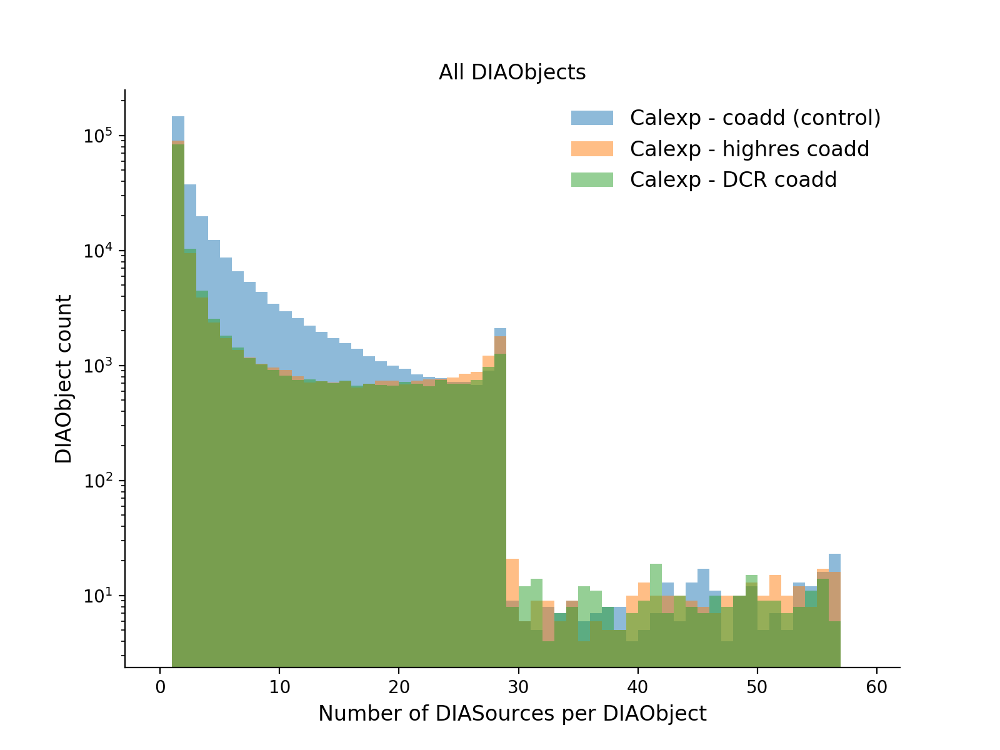

Text(0.5, 1.0, 'All DIAObjects')

In [9]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
#plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTableRef['nDiaSources'].values, bins=np.arange(0, 60), color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(objTableCw['nDiaSources'].values, bins=np.arange(0, 60), color='C1', alpha=0.5, label='Calexp - highres coadd')
plt.hist(objTableDcr['nDiaSources'].values, bins=np.arange(0, 60), color='C2', alpha=0.5, label='Calexp - DCR coadd')

plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('All DIAObjects')

In [10]:
def makeSrcTableFlags(srcTbl, objTbl):
    config = MapDiaSourceConfig()
    unpacker = UnpackPpdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    flagFilter = ((srcTableFlags['base_PixelFlags_flag_bad']) | 
                  (srcTableFlags['base_PixelFlags_flag_suspect']) |
                  (srcTableFlags['base_PixelFlags_flag_saturatedCenter']) |
                  (srcTableFlags['slot_Shape_flag'])
                 )
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    badObj = objTbl.loc[~objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj, badObj

In [13]:
flagTableRef, flagValuesRef, srcRef,  \
    yesFlagRef, noFlagRef, goodSrcRef, goodObjRef, badObjRef = makeSrcTableFlags(srcTableRef, objTableRef)
flagTableCw, flagValuesCw, srcCw, \
    yesFlagCw, noFlagCw, goodSrcCw, goodObjCw, badObjCw = makeSrcTableFlags(srcTableCw, objTableCw)
flagTableDcr, flagValuesDcr, srcDcr, \
    yesFlagDcr, noFlagDcr, goodSrcDcr, goodObjDcr, badObjDcr = makeSrcTableFlags(srcTableDcr, objTableDcr)

<IPython.core.display.Javascript object>


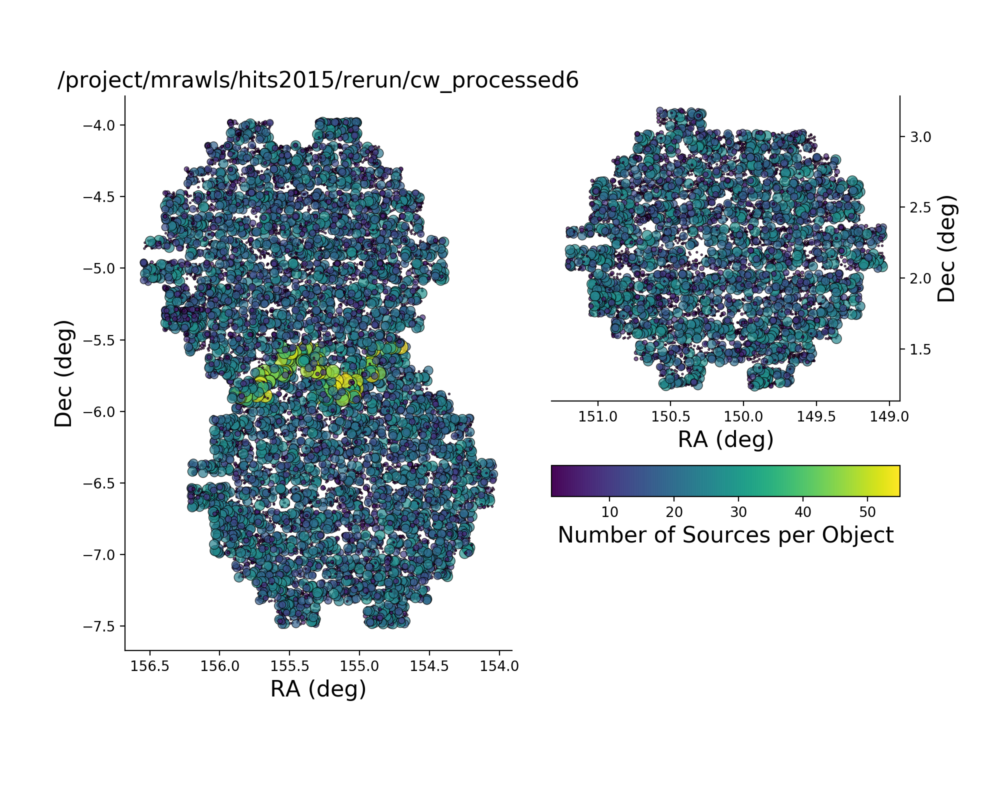

In [12]:
objFilterRef = (goodObjRef['nDiaSources'] > 0)
fig1 = plotDiaObjectsOnSky(repoRef, goodObjRef, objFilterRef, hits=True)

<IPython.core.display.Javascript object>


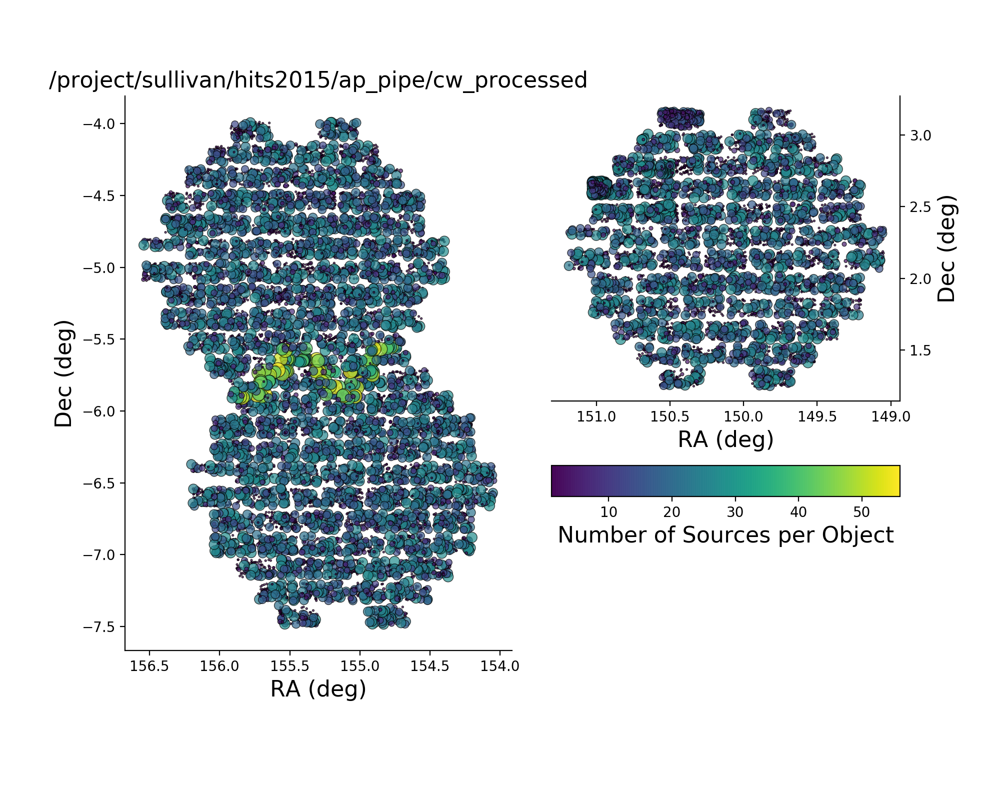

In [14]:
objFilterCw = (goodObjCw['nDiaSources'] > 0)
fig2 = plotDiaObjectsOnSky(repoCw, goodObjCw, objFilterCw, hits=True)

<IPython.core.display.Javascript object>


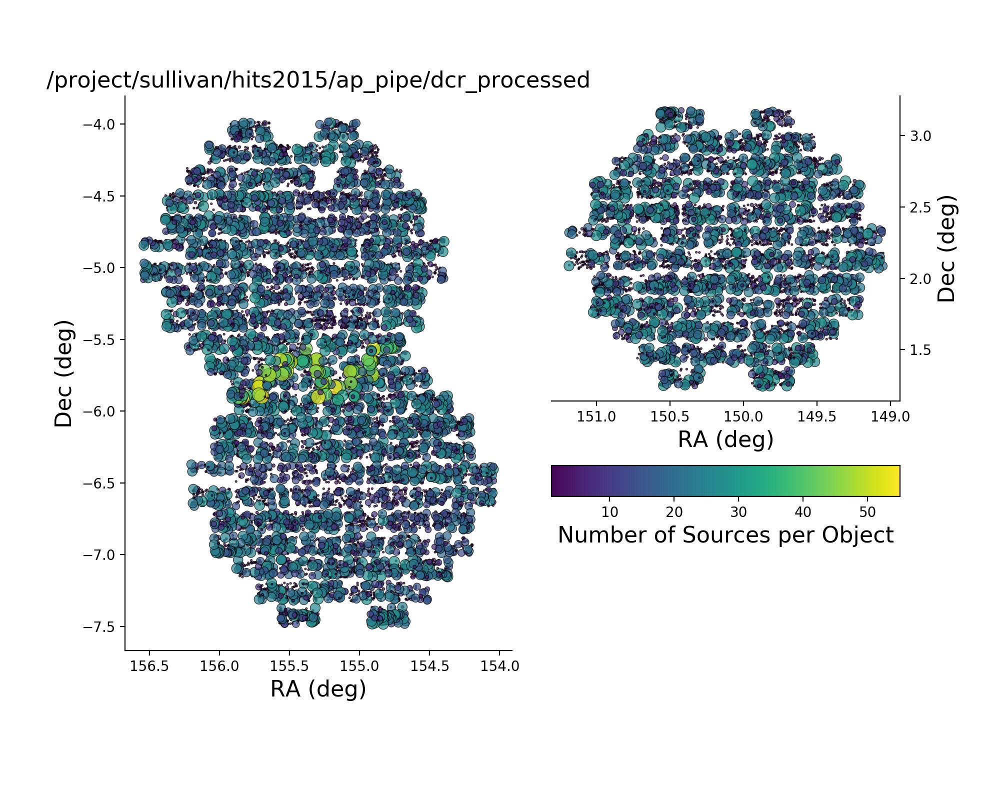

In [15]:
objFilterDcr = (goodObjDcr['nDiaSources'] > 0)
fig3 = plotDiaObjectsOnSky(repoDcr, goodObjDcr, objFilterDcr, hits=True)

In [16]:
def plotZoomedRegion(objTable, srcTable):
    fig = plt.figure(figsize=(9,6))
    plt.scatter(srcTable['ra'], 
                srcTable['decl'], 
                color='C1', s=5, alpha=0.3)
    plt.scatter(objTable.loc[(objTable['nDiaSources'] >= 20), 'ra'], 
                objTable.loc[(objTable['nDiaSources'] >= 20), 'decl'], 
                color='C0', s=15, alpha=0.3)
    plt.xlabel('RA (deg)')
    plt.ylabel('Dec (deg)')
    plt.gca().set_xlim(155.3, 154.8)
    plt.gca().set_ylim(-6.02, -5.60)
    #plt.gca().invert_xaxis()
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    #box = plt.gca().get_position()
    #plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
    #plt.legend(bbox_to_anchor=(0.97, 0.9))

<IPython.core.display.Javascript object>


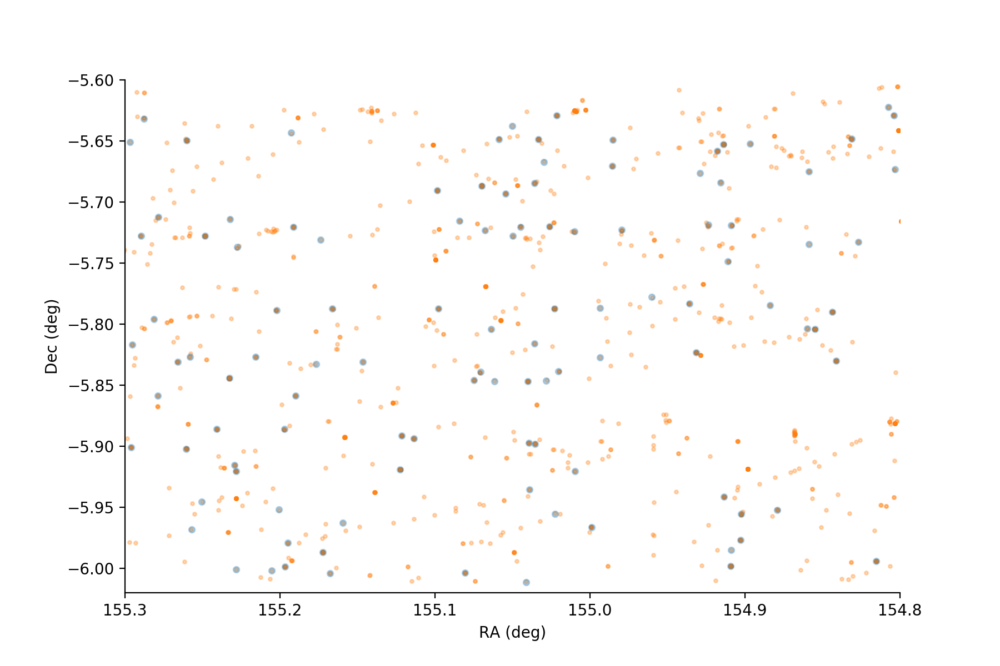

In [17]:
plotZoomedRegion(goodObjRef, goodSrcRef)

<IPython.core.display.Javascript object>


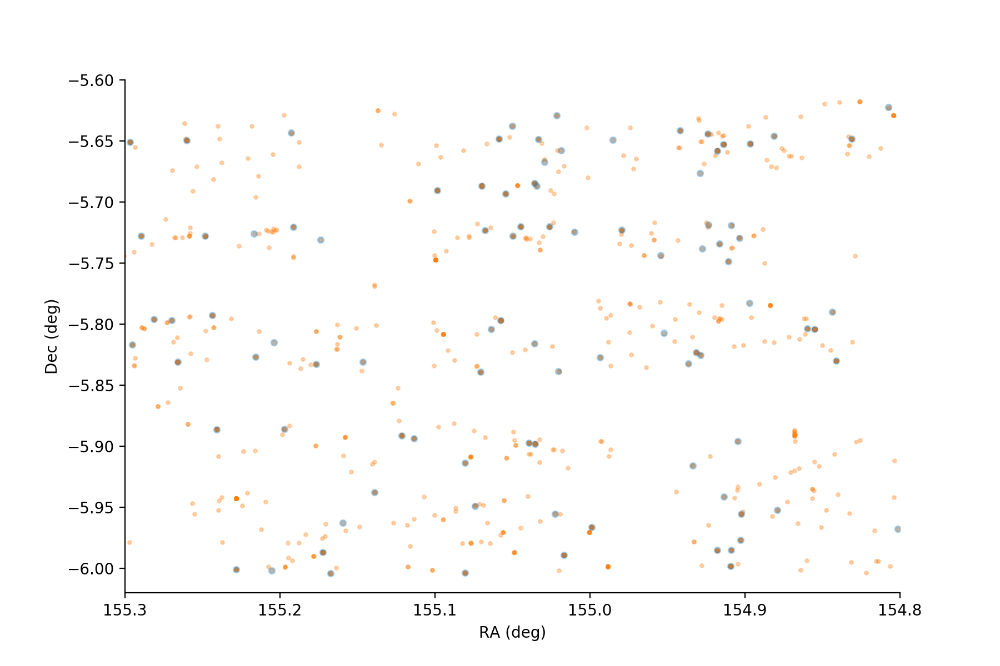

In [19]:
plotZoomedRegion(goodObjCw, goodSrcCw)

<IPython.core.display.Javascript object>


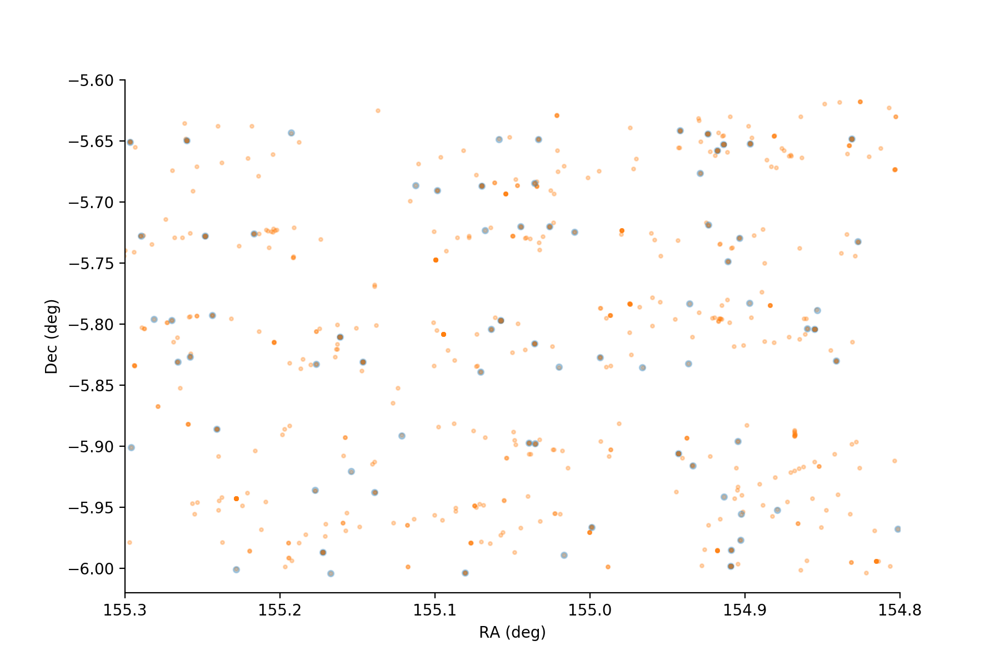

In [18]:
plotZoomedRegion(goodObjDcr, goodSrcDcr)

<IPython.core.display.Javascript object>


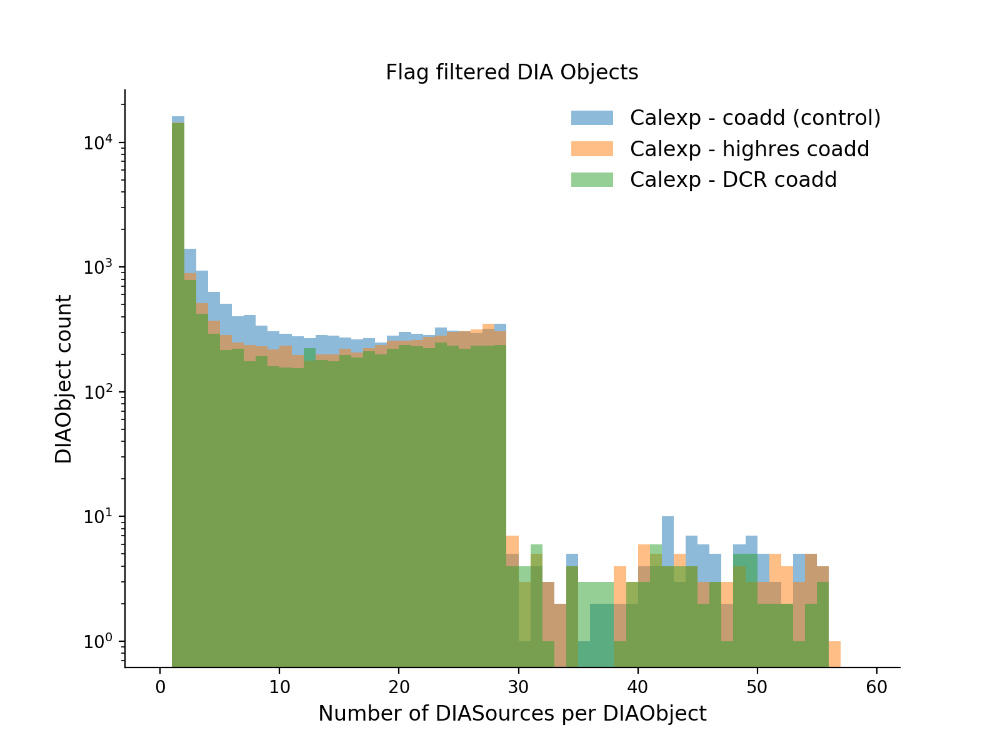

Text(0.5, 1.0, 'Flag filtered DIA Objects')

In [20]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(goodObjRef['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(goodObjCw['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='Calexp - highres coadd')
plt.hist(goodObjDcr['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='Calexp - DCR coadd')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flag filtered DIA Objects')

<IPython.core.display.Javascript object>


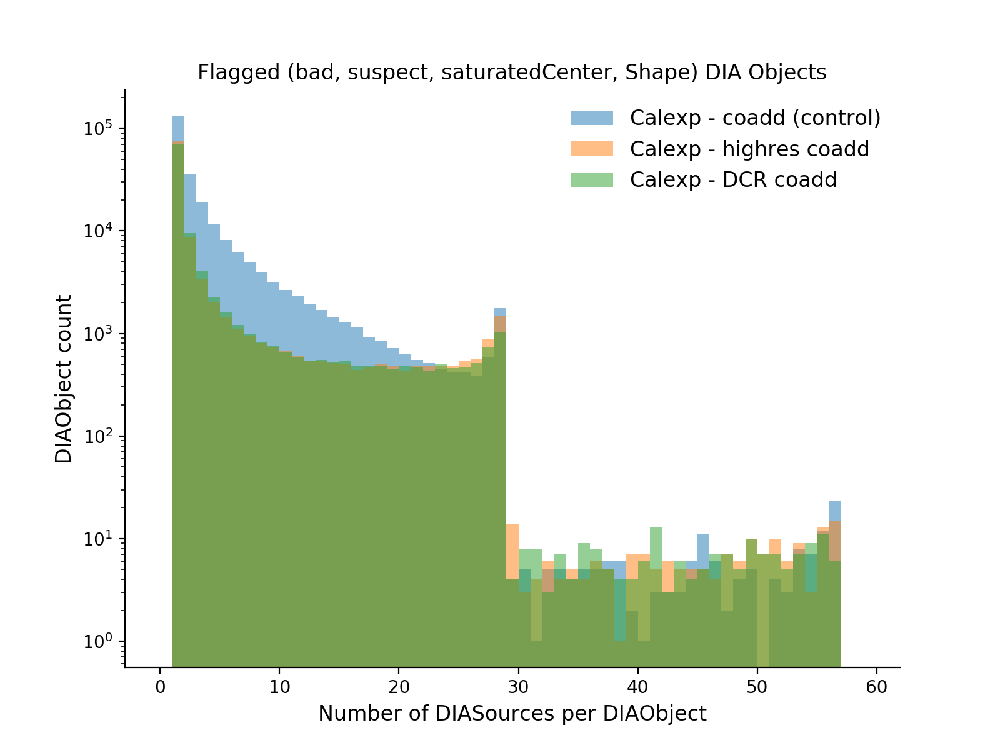

Text(0.5, 1.0, 'Flagged (bad, suspect, saturatedCenter, Shape) DIA Objects')

In [19]:
# Similar plot as above, but now with the BAD things instead of the good things
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.yscale('log')
plt.hist(badObjRef['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C0', alpha=0.5, label='Calexp - coadd (control)')
plt.hist(badObjCw['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C1', alpha=0.5, label='Calexp - highres coadd')
plt.hist(badObjDcr['nDiaSources'].values, bins=np.arange(0, 60), 
         color='C2', alpha=0.5, label='Calexp - DCR coadd')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title('Flagged (bad, suspect, saturatedCenter, Shape) DIA Objects')

In [20]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C5')
    psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               centroidflags[0],
               apfluxflags[0], 
               psffluxflags[0],
               ip_diffimflags[0],
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags',
               'Centroid flags',
               'ApFlux flags',
               'PsfFlux flags',
               'ip_diffim flags',
               'Shape flags'),
              frameon=False, loc='upper right', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().set_xlim([0, 720000])
    plt.title(title)

<IPython.core.display.Javascript object>


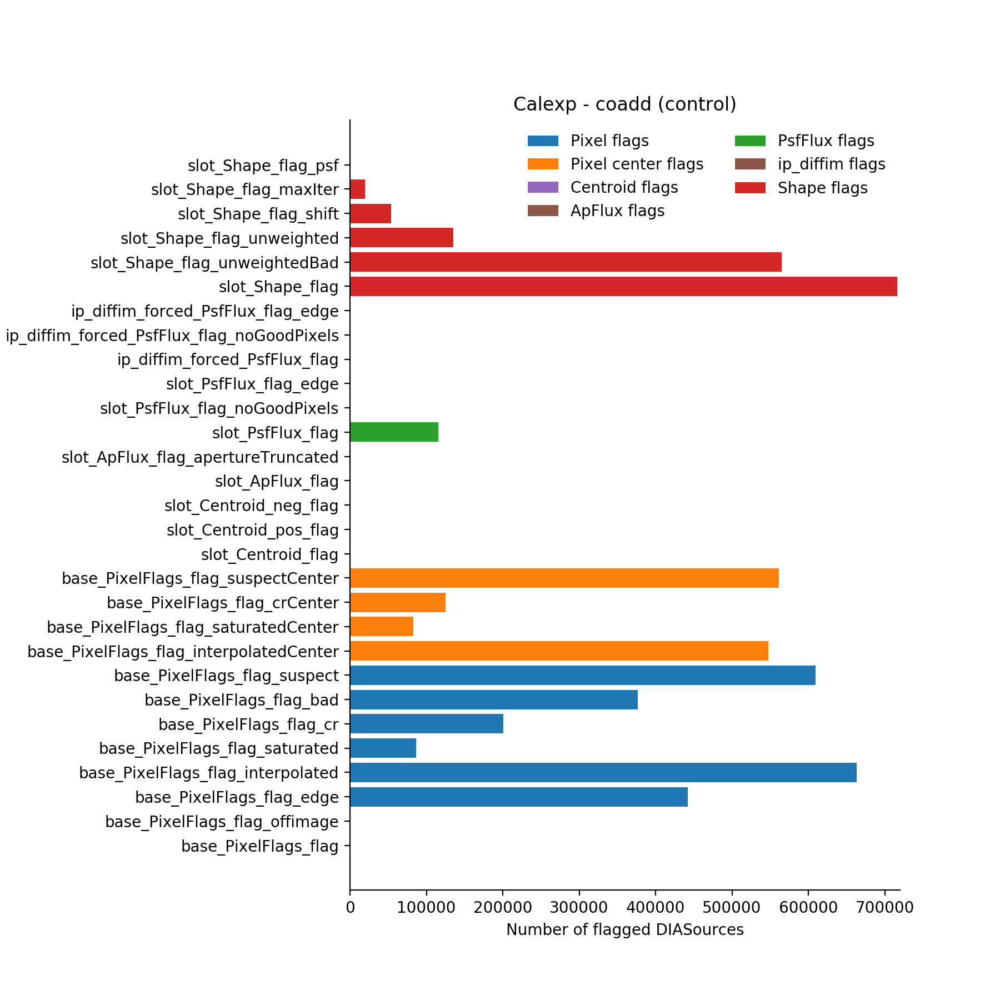

In [21]:
plot_flag_hist([count for count in flagTableRef.sum().values], 
               flagValuesRef.dtype.names, title='Calexp - coadd (control)')

<IPython.core.display.Javascript object>


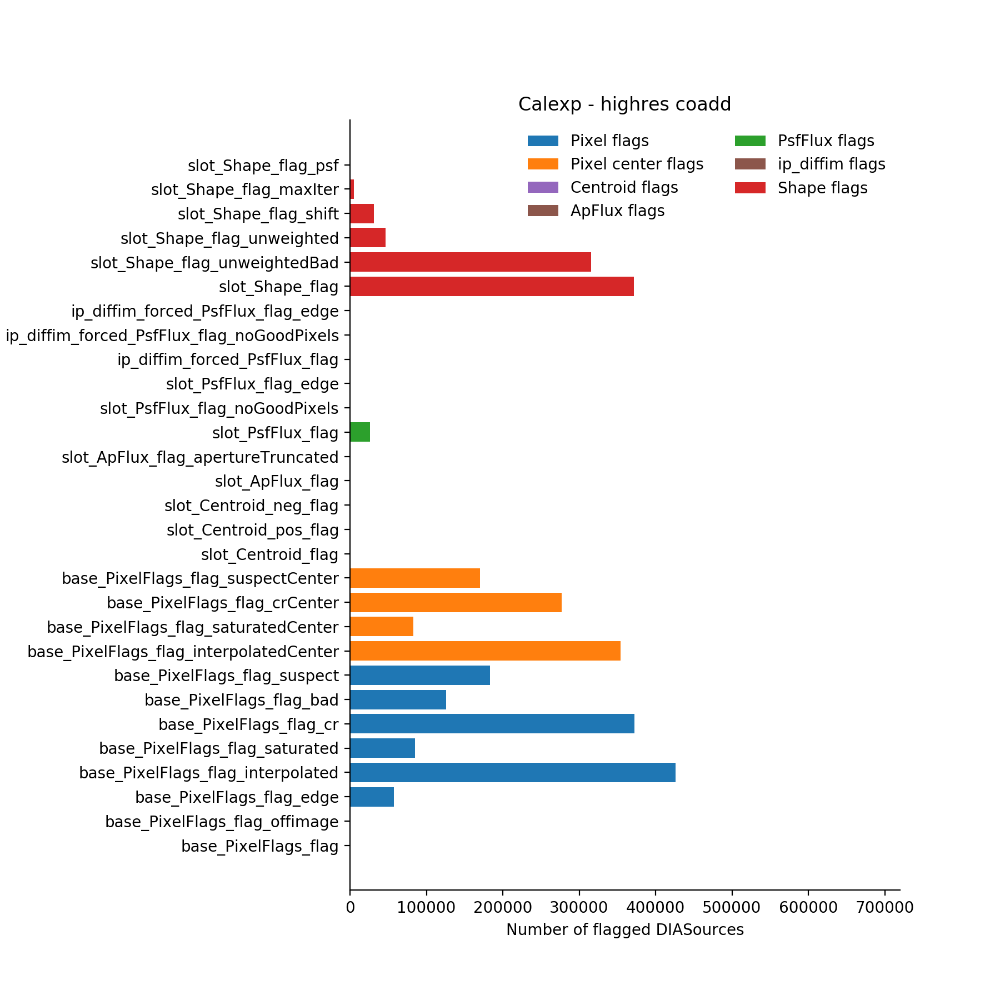

In [22]:
plot_flag_hist([count for count in flagTableCw.sum().values], 
               flagValuesCw.dtype.names, title='Calexp - highres coadd')

<IPython.core.display.Javascript object>


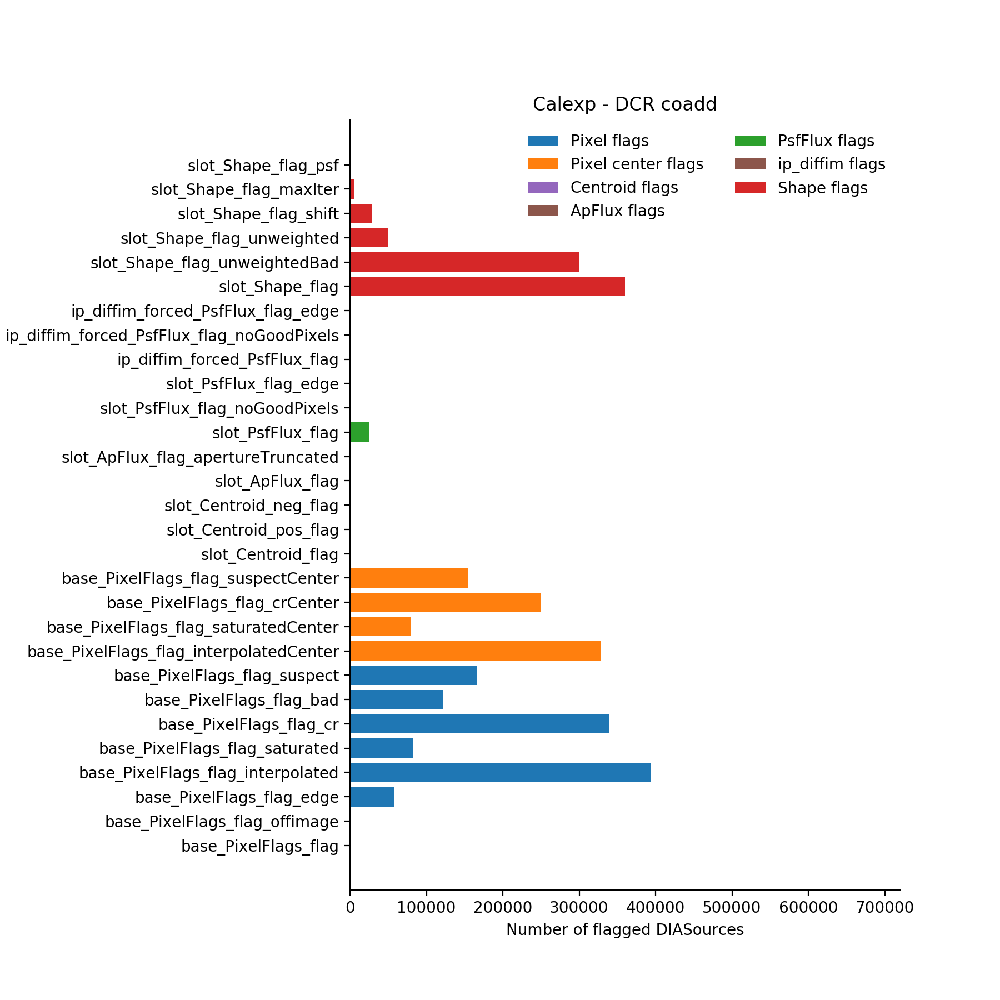

In [24]:
plot_flag_hist([count for count in flagTableDcr.sum().values], 
               flagValuesDcr.dtype.names, title='Calexp - DCR coadd')

## Raw DIASource Counts

In [23]:
# Total number of DIASources in each rerun
print(len(srcTableRef), len(srcTableCw), len(srcTableDcr))

976816 501076 460447


So there are ~10% fewer sources using the DCR template

In [24]:
# Total number of flag-filtered DIASources in each rerun
print(len(goodSrcRef), len(goodSrcCw), len(goodSrcDcr))

53477 47225 39592


And there are ~20% fewer "good" sources left after flagging using the DCR template

## A couple cutouts and light curves

Define a couple functions to help compare sources between different runs

In [25]:
def getObjIdFromAnotherRun(objId1, objTable1, objTable2):
    raObj = objTable1.loc[objTable1['diaObjectId'] == objId1, 'ra']
    decObj = objTable1.loc[objTable1['diaObjectId'] == objId1, 'decl']
    skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)
    objTable2SkyCoords = coord.SkyCoord(objTable2['ra'], objTable2['decl'], unit=u.degree)
    matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(objTable2SkyCoords)
    if len(matchIdx) > 1: print('Warning: More than 1 match found, using first one only')
    objId2 = objTable2.iloc[matchIdx[0]]['diaObjectId']
    return objId2

In [26]:
def getObjIdFromRaDec(objId1, objTable1, objTable2):
    raObj = objTable1.loc[objTable1['diaObjectId'] == objId1, 'ra']
    decObj = objTable1.loc[objTable1['diaObjectId'] == objId1, 'decl']
    skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)
    objTable2SkyCoords = coord.SkyCoord(objTable2['ra'], objTable2['decl'], unit=u.degree)
    matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(objTable2SkyCoords)
    if len(matchIdx) > 1: print('Warning: More than 1 match found, using first one only')
    objId2 = objTable2.iloc[matchIdx[0]]['diaObjectId']
    return objId2

In [27]:
from plotLightcurve import loadPpdbSources

In [28]:
goodObjRefList = [obj for obj in goodObjRef.loc[(goodObjRef['nDiaSources'] == 28), 'diaObjectId'].values]
print(len(goodObjRefList))

349


Loading PPDB Sources...
DIAObject ID: 176486721658028409
RA (deg): [150.49762096]
Dec (deg): [2.65988625]
Number of DIASources: 28


<IPython.core.display.Javascript object>


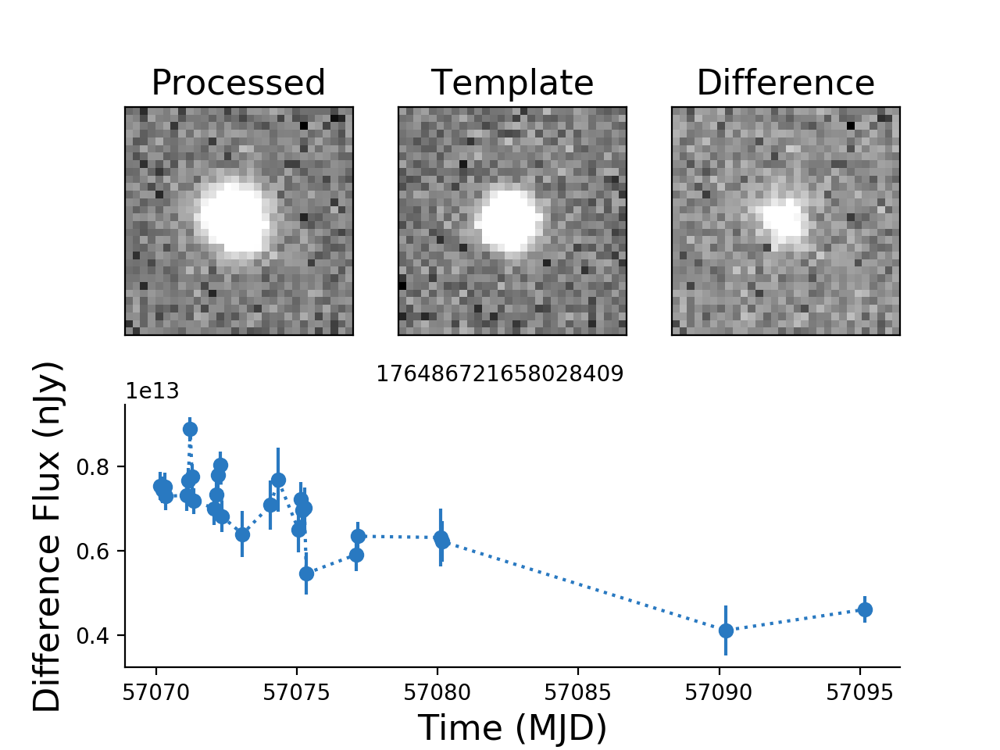

Template dataId {'tract': 0, 'patch': '24,30', 'filter': 'g'}


<IPython.core.display.Javascript object>


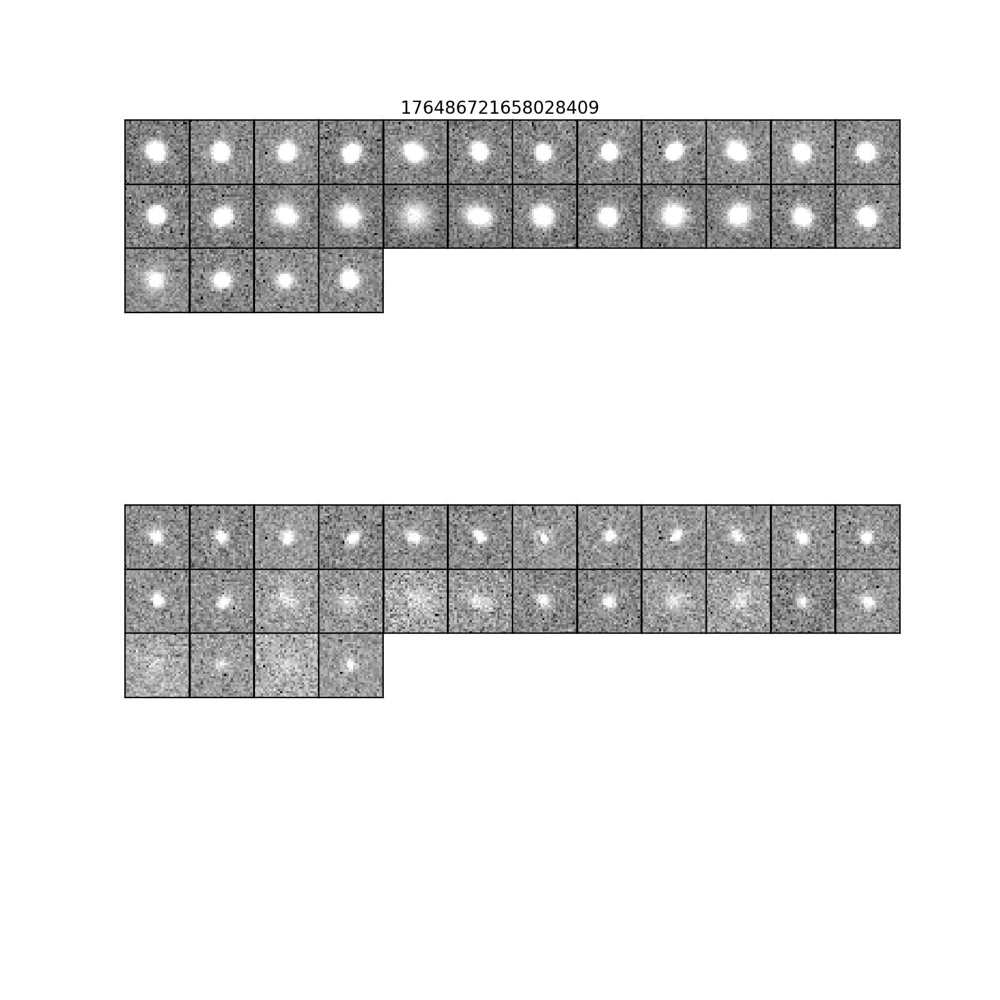

Loading PPDB Sources...
DIAObject ID: 176486721658028189
RA (deg): [150.4976143]
Dec (deg): [2.65987814]
Number of DIASources: 28


<IPython.core.display.Javascript object>


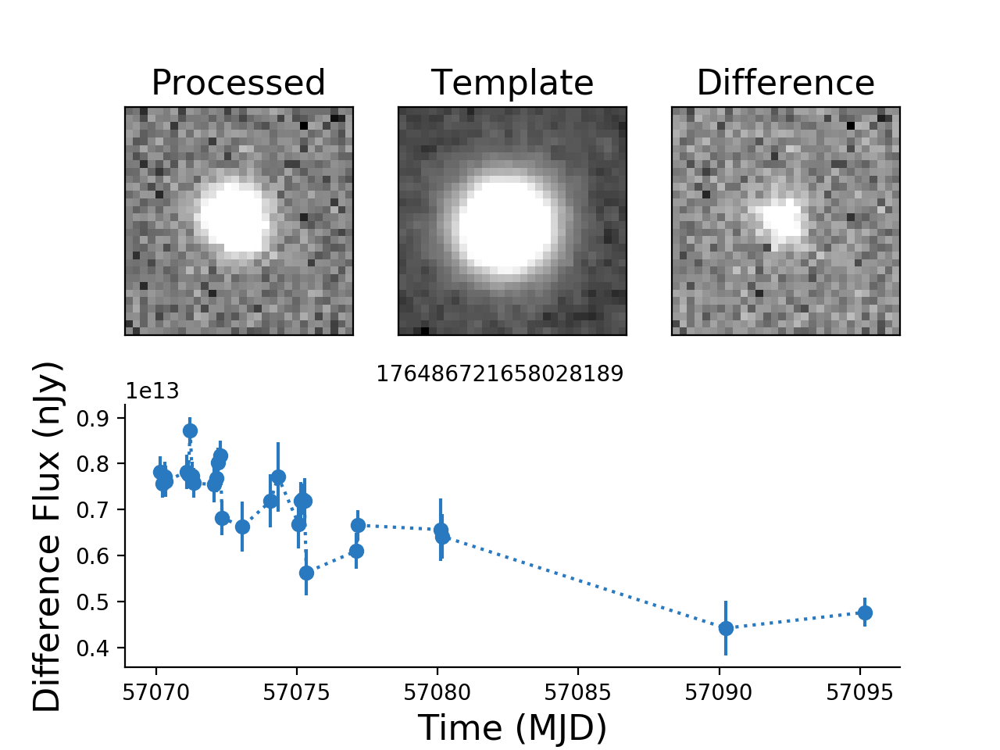

Template dataId {'tract': 0, 'patch': '39,51', 'filter': 'g'}


<IPython.core.display.Javascript object>


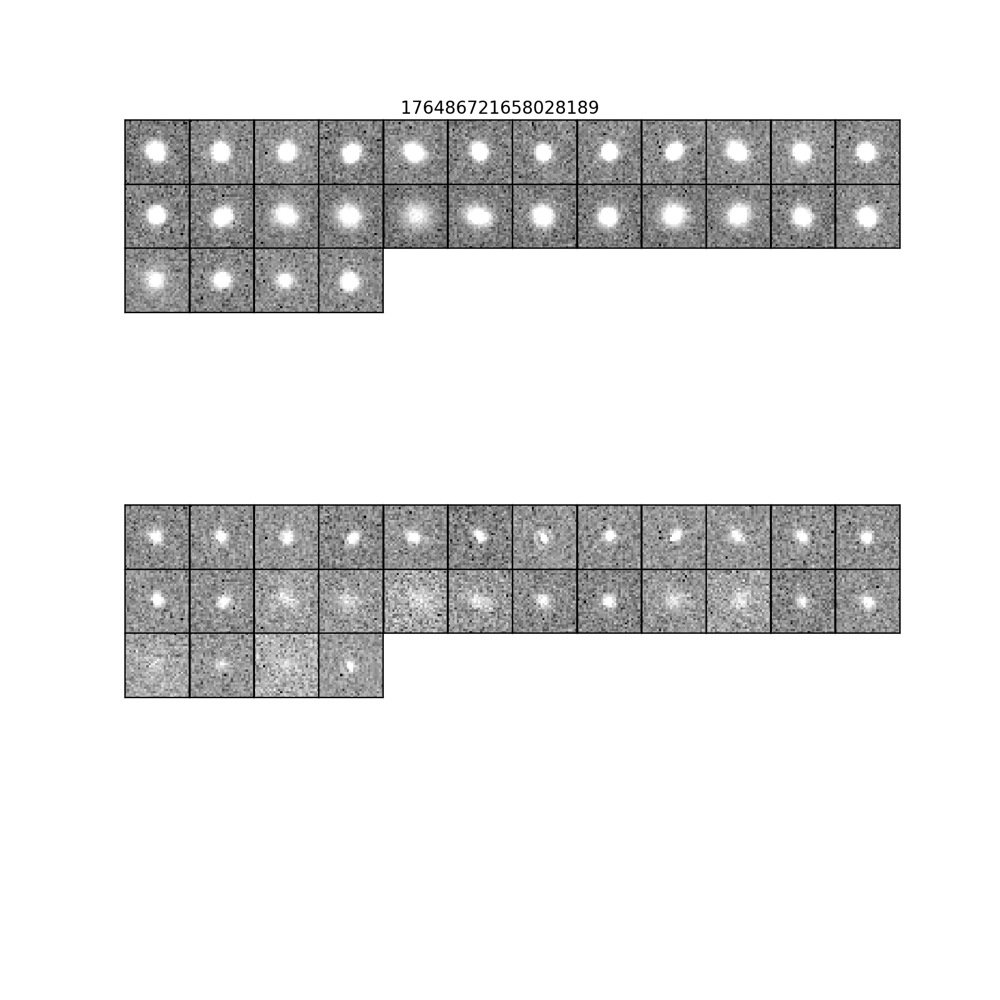

Loading PPDB Sources...
DIAObject ID: 176486721658028189
RA (deg): [150.49760584]
Dec (deg): [2.659876]
Number of DIASources: 28


<IPython.core.display.Javascript object>


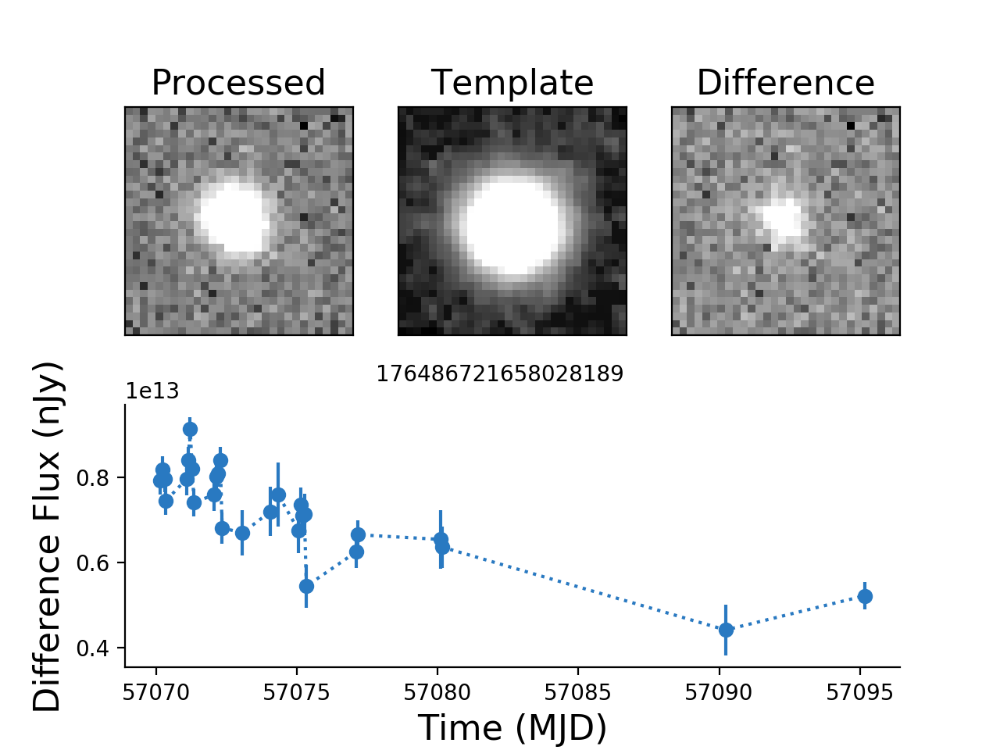

Template dataId {'tract': 0, 'patch': '39,51', 'filter': 'g'}


<IPython.core.display.Javascript object>


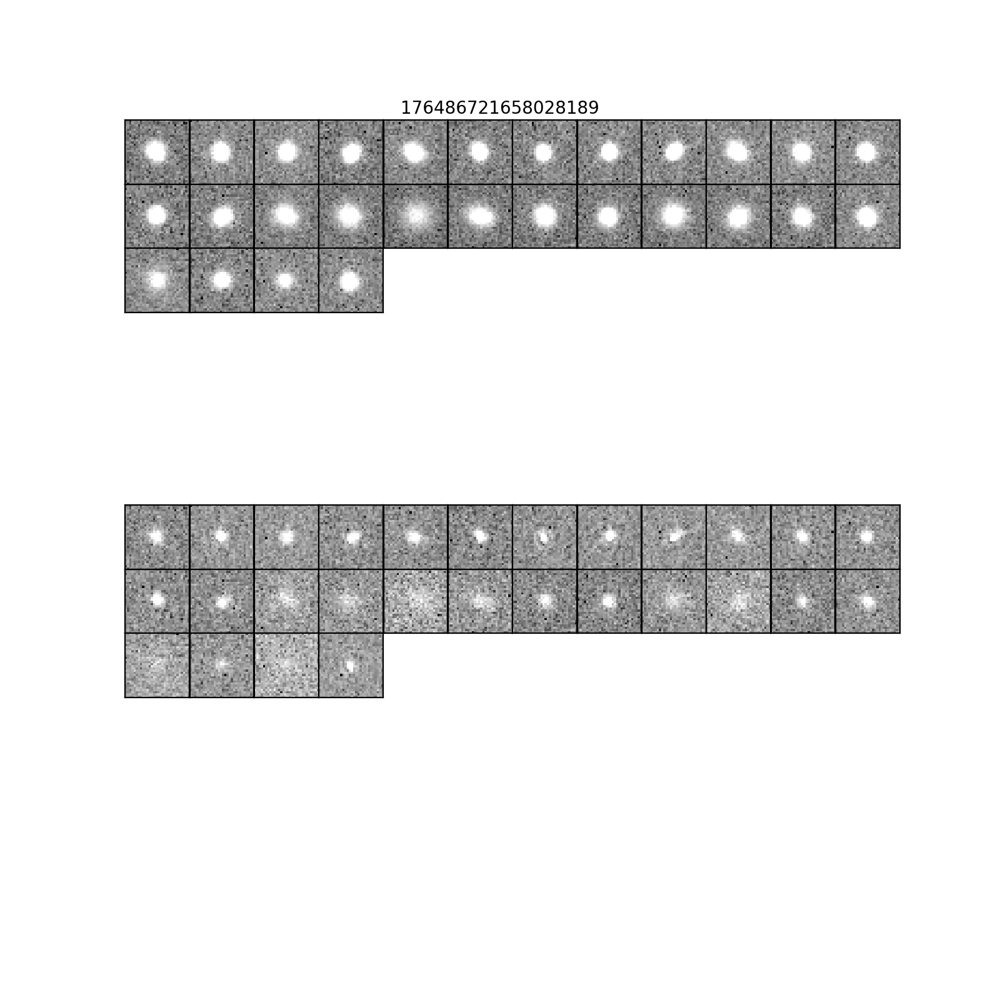

In [29]:
objInd1 = 37
plc.plotLightcurve(goodObjRefList[objInd1], goodObjRef, repoRef, dbPathRef, repoRef, plotAllCutouts=True)
objCw = getObjIdFromAnotherRun(goodObjRefList[objInd1], goodObjRef, goodObjCw)
plc.plotLightcurve(objCw, goodObjCw, repoCw, dbPathCw, repoCw, plotAllCutouts=True)
objDcr = getObjIdFromAnotherRun(goodObjRefList[objInd1], goodObjRef, goodObjDcr)
plc.plotLightcurve(objDcr, goodObjDcr, repoDcr, dbPathDcr, repoDcr, plotAllCutouts=True,
                   diffimType='dcrDiff_differenceExp')

Loading PPDB Sources...
DIAObject ID: 176486674413388136
RA (deg): [150.19441018]
Dec (deg): [2.93741111]
Number of DIASources: 28


<IPython.core.display.Javascript object>


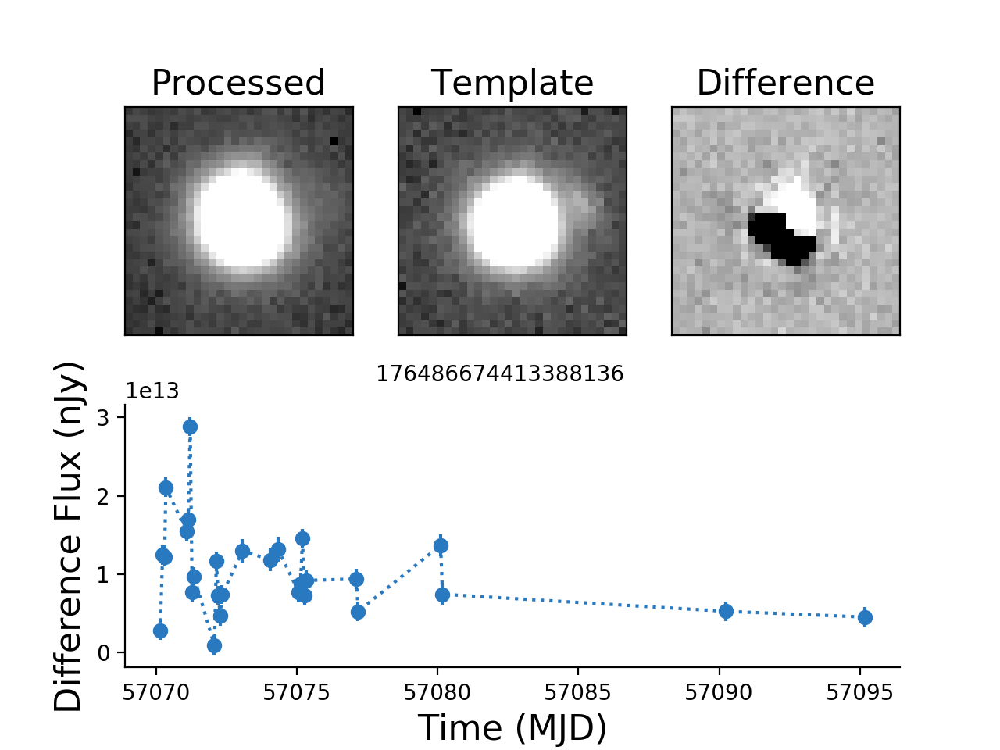

Template dataId {'tract': 0, 'patch': '24,31', 'filter': 'g'}


<IPython.core.display.Javascript object>


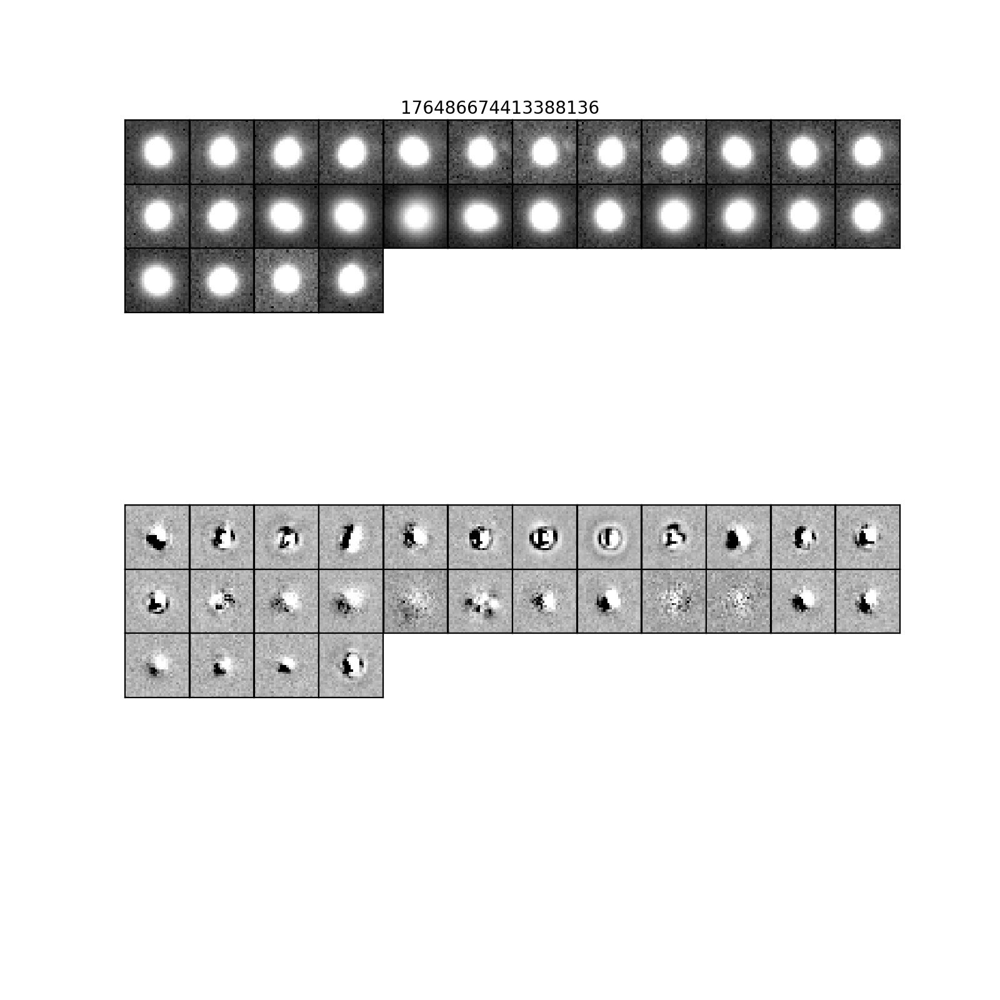

Loading PPDB Sources...
DIAObject ID: 176486674413387954
RA (deg): [150.19439063]
Dec (deg): [2.93742933]
Number of DIASources: 27


<IPython.core.display.Javascript object>


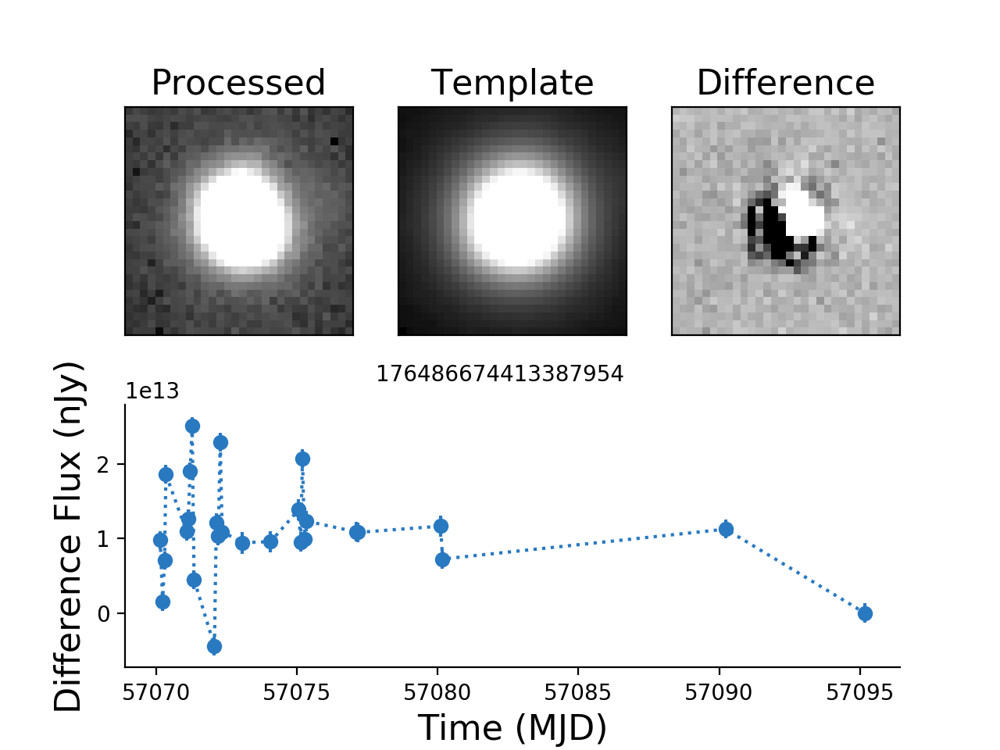

Template dataId {'tract': 0, 'patch': '41,52', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


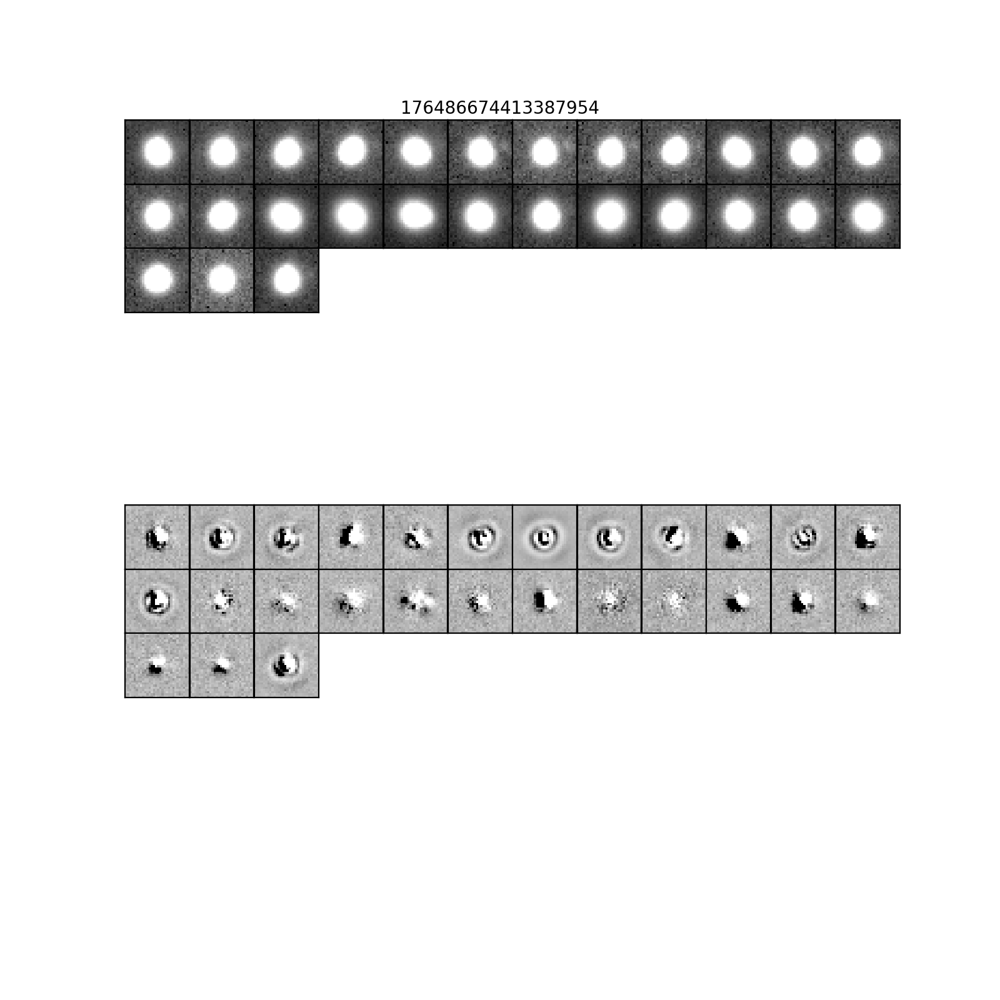

Loading PPDB Sources...
DIAObject ID: 176486674413387944
RA (deg): [150.19441738]
Dec (deg): [2.93743034]
Number of DIASources: 23


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


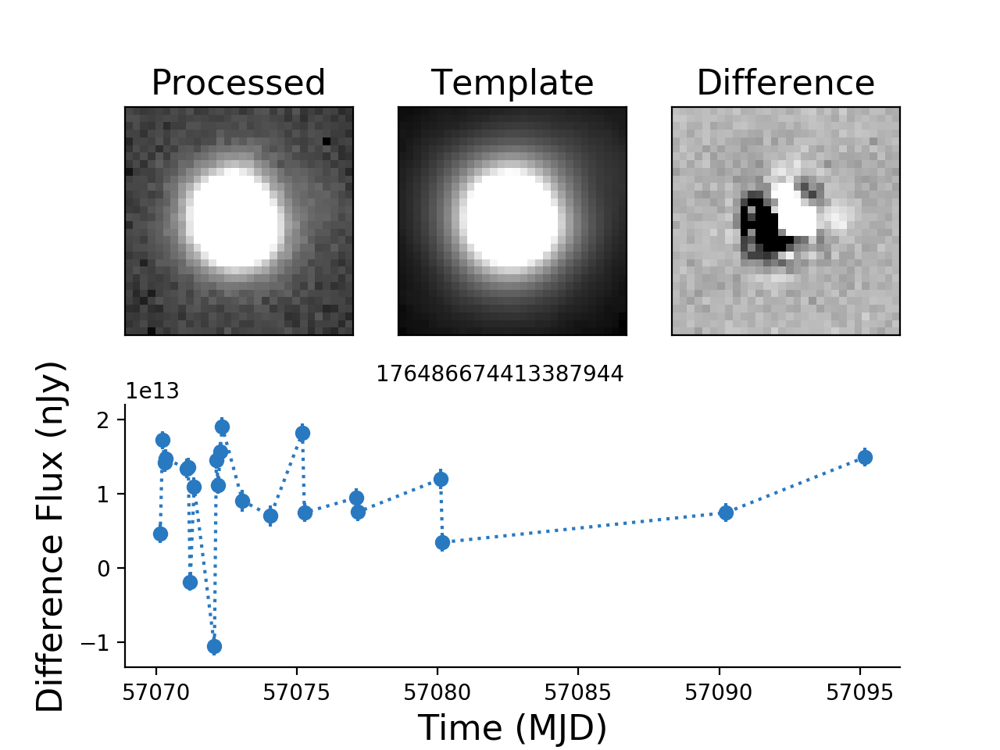

Template dataId {'tract': 0, 'patch': '41,52', 'filter': 'g'}


<IPython.core.display.Javascript object>


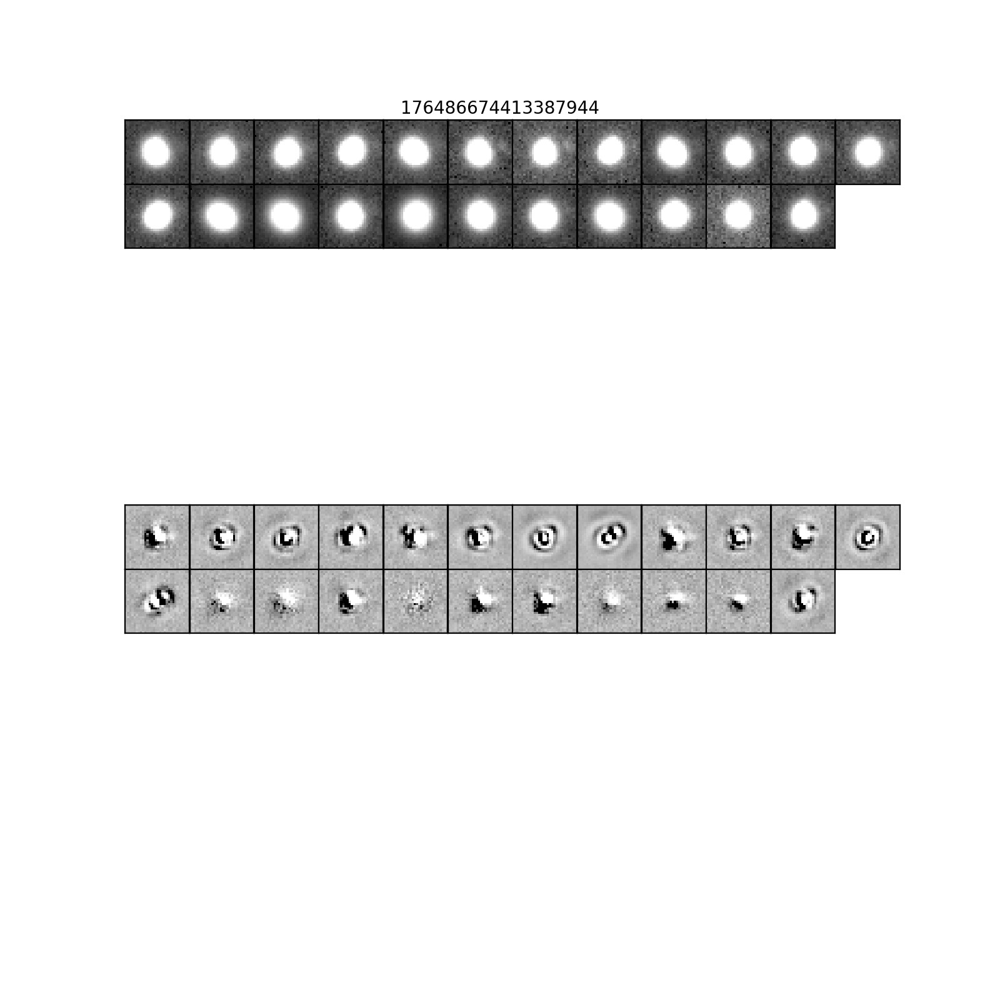

In [35]:
objInd1 = 13
plc.plotLightcurve(goodObjRefList[objInd1], goodObjRef, repoRef, dbPathRef, repoRef, plotAllCutouts=True)
objCw = getObjIdFromAnotherRun(goodObjRefList[objInd1], goodObjRef, goodObjCw)
plc.plotLightcurve(objCw, goodObjCw, repoCw, dbPathCw, repoCw, plotAllCutouts=True)
objDcr = getObjIdFromAnotherRun(goodObjRefList[objInd1], goodObjRef, goodObjDcr)
plc.plotLightcurve(objDcr, goodObjDcr, repoDcr, dbPathDcr, repoDcr, plotAllCutouts=True,
                   diffimType='dcrDiff_differenceExp')

# Conclusions

The higher resolution templates (0.20"/pixel) result in ~2x fewer detections than the low-resolution template (0.33"/pixel), though both are warped to match the resolution of the science images. We are also running the decorrelation afterburner, which should correct the 5-σ noise threshold for detection.

The DCR templates appear to result in ~20% fewer detections after all flagging, though the cutouts displayed above still appear to show significant dipoles. This suggests that something is still not being calculate quite right for the DCR matched templates. Based on the results of https://dmtn-121.lsst.io, I would expect at least a 50% reduction in source detections for the range of seeing used to construct the template, and it is not there yet.

Finally, in all three cases there are significant deconvolution artifacts in many of the cutouts.
These occur when the science image PSF is sharper than the template PSF, and could be fixed by convolving the science image by the matching kernel instead of the template. This should be revisited once that option is available.

# Appendix: Visualize the skymap

In [30]:
dataId = {'filter': 'g', 'tract': 0}
skymap = butlerDcr.get('deepCoadd_skyMap', dataId=dataId)

## From DM-15080-Coadds-Party.ipynb

In [31]:
# Wildly pasting some pipe_analysis plotting stuff into here... and editing it a bit to suck slightly less...

def percent(values, p=0.5):
    """Return a value a faction of the way between the min and max values in a list."""
    m = min(values)
    interval = max(values) - m
    return m + p*interval

def bboxToRaDec(bbox, wcs):
    """Get the corners of a BBox and convert them to lists of RA and Dec."""
    corners = []
    for corner in bbox.getCorners():
        p = geom.Point2D(corner.getX(), corner.getY())
        coord = wcs.pixelToSky(p)
        corners.append([coord.getRa().asDegrees(), coord.getDec().asDegrees()])
    ra, dec = zip(*corners)
    return ra, dec

def getRaDecMinMaxPatchList(patchList, tractInfo, pad=0.0, nDecimals=4, raMin=360.0, raMax=0.0,
                            decMin=90.0, decMax=-90.0):
    """Find the max and min RA and DEC (deg) boundaries encompased in the patchList
    Parameters
    ----------
    patchList : `list` of `str`
       List of patch IDs.
    tractInfo : `lsst.skymap.tractInfo.ExplicitTractInfo`
       Tract information associated with the patches in patchList
    pad : `float`
       Pad the boundary by pad degrees
    nDecimals : `int`
       Round coordinates to this number of decimal places
    raMin, raMax : `float`
       Initiate minimum[maximum] RA determination at raMin[raMax] (deg)
    decMin, decMax : `float`
       Initiate minimum[maximum] DEC determination at decMin[decMax] (deg)
    Returns
    -------
    `lsst.pipe.base.Struct`
       Contains the ra and dec min and max values for the patchList provided
    """
    for ip, patch in enumerate(tractInfo):
        if str(patch.getIndex()[0])+","+str(patch.getIndex()[1]) in patchList:
            raPatch, decPatch = bboxToRaDec(patch.getOuterBBox(), tractInfo.getWcs())
            raMin = min(np.round(min(raPatch) - pad, nDecimals), raMin)
            raMax = max(np.round(max(raPatch) + pad, nDecimals), raMax)
            decMin = min(np.round(min(decPatch) - pad, nDecimals), decMin)
            decMax = max(np.round(max(decPatch) + pad, nDecimals), decMax)
    return Struct(
        raMin = raMin,
        raMax = raMax,
        decMin = decMin,
        decMax = decMax,
    )

def plotTractOutline(axes, tractInfo, patchList, fontSize=5, maxDegBeyondPatch=1.5):
    """Plot the the outline of the tract and patches highlighting those with data
    As some skyMap settings can define tracts with a large number of patches, this can
    become very crowded.  So, if only a subset of patches are included, find the outer
    boudary of all patches in patchList and only plot to maxDegBeyondPatch degrees
    beyond those boundaries (in all four directions).
    Parameters
    ----------
    tractInfo : `lsst.skymap.tractInfo.ExplicitTractInfo`
       Tract information object for extracting tract RA and DEC limits.
    patchList : `list` of `str`
       List of patch IDs with data to be plotted.  These will be color shaded in the outline plot.
    fontSize : `int`
       Font size for plot labels.
    maxDegBeyondPatch : `float`
       Maximum number of degrees to plot beyond the border defined by all patches with data to be plotted.
    """
    buff = 0.02
    axes.tick_params(which="both", direction="in", labelsize=fontSize)
    axes.locator_params(nbins=6)
    axes.ticklabel_format(useOffset=False)

    tractRa, tractDec = bboxToRaDec(tractInfo.getBBox(), tractInfo.getWcs())
    patchBoundary = getRaDecMinMaxPatchList(patchList, tractInfo, pad=maxDegBeyondPatch)

    xMin = min(max(tractRa), patchBoundary.raMax) + buff
    xMax = max(min(tractRa), patchBoundary.raMin) - buff
    yMin = max(min(tractDec), patchBoundary.decMin) - buff
    yMax = min(max(tractDec), patchBoundary.decMax) + buff
    xlim = xMin, xMax
    ylim = yMin, yMax
    axes.fill(tractRa, tractDec, fill=True, edgecolor='k', lw=1, linestyle='solid',
              color="black", alpha=0.2)
    for ip, patch in enumerate(tractInfo):
        patchIndexStr = str(patch.getIndex()[0]) + "," + str(patch.getIndex()[1])
        color = "k"
        alpha = 0.05
        if patchIndexStr in patchList:
            #color = ("c", "g", "r", "b", "m")[ip%5]
            color='g'
            alpha = 0.5
        ra, dec = bboxToRaDec(patch.getOuterBBox(), tractInfo.getWcs())
        deltaRa = abs(max(ra) - min(ra))
        deltaDec = abs(max(dec) - min(dec))
        pBuff = 0.5*max(deltaRa, deltaDec)
        centerRa = min(ra) + 0.5*deltaRa
        centerDec = min(dec) + 0.5*deltaDec
        if (centerRa < xMin + pBuff and centerRa > xMax - pBuff and
                centerDec > yMin - pBuff and centerDec < yMax + pBuff):
            axes.fill(ra, dec, fill=True, color=color, lw=1, linestyle="solid", alpha=alpha)
            if patchIndexStr in patchList or (centerRa < xMin - 0.2*pBuff and
                                              centerRa > xMax + 0.2*pBuff and
                                              centerDec > yMin + 0.2*pBuff and
                                              centerDec < yMax - 0.2*pBuff):
                axes.text(percent(ra), percent(dec, 0.5), str(patchIndexStr),
                          fontsize=fontSize - 1, horizontalalignment="center", verticalalignment="center")
    #axes.text(percent((xMin, xMax), 1.06), percent((yMin, yMax), -0.08), "RA",
    #          fontsize=fontSize, horizontalalignment="center", verticalalignment="center", color="k")
    #axes.text(percent((xMin, xMax), 1.15), percent((yMin, yMax), 0.01), "Dec",
    #          fontsize=fontSize, horizontalalignment="center", verticalalignment="center",
    #          rotation="vertical", color="k")
    axes.set_xlabel('RA', size='large')
    axes.set_ylabel('Dec', size='large')
    axes.set_xlim(xlim)
    axes.set_ylim(ylim)

In [32]:
# Instead of using a manually defined patch list to figure out which patches
# have warps/coadds in them, go through each patch and try opening its coadd.
# If that succeeds, add the patch ID to our happy patch list.

for tractInfo in skymap:
    good_patch_list = [str(patch.getIndex()[0]) + ',' + str(patch.getIndex()[1]) for patch in tractInfo]
    better_patch_list = []
    for patch in good_patch_list:
        try:
            dataId = {'filter': 'g', 'tract': 0, 'patch': patch}
            coadd_test = butlerDcr.get('deepCoadd', dataId=dataId)
        except:
            continue
        else:
            print('This patch has a coadd', patch)
            better_patch_list.append(patch)

This patch has a coadd 17,5
This patch has a coadd 18,5
This patch has a coadd 19,5
This patch has a coadd 20,5
This patch has a coadd 21,5
This patch has a coadd 16,6
This patch has a coadd 17,6
This patch has a coadd 18,6
This patch has a coadd 19,6
This patch has a coadd 20,6
This patch has a coadd 21,6
This patch has a coadd 22,6
This patch has a coadd 14,7
This patch has a coadd 15,7
This patch has a coadd 16,7
This patch has a coadd 17,7
This patch has a coadd 18,7
This patch has a coadd 19,7
This patch has a coadd 20,7
This patch has a coadd 21,7
This patch has a coadd 22,7
This patch has a coadd 23,7
This patch has a coadd 14,8
This patch has a coadd 15,8
This patch has a coadd 16,8
This patch has a coadd 17,8
This patch has a coadd 18,8
This patch has a coadd 19,8
This patch has a coadd 20,8
This patch has a coadd 21,8
This patch has a coadd 22,8
This patch has a coadd 23,8
This patch has a coadd 14,9
This patch has a coadd 15,9
This patch has a coadd 16,9
This patch has a coa

<IPython.core.display.Javascript object>


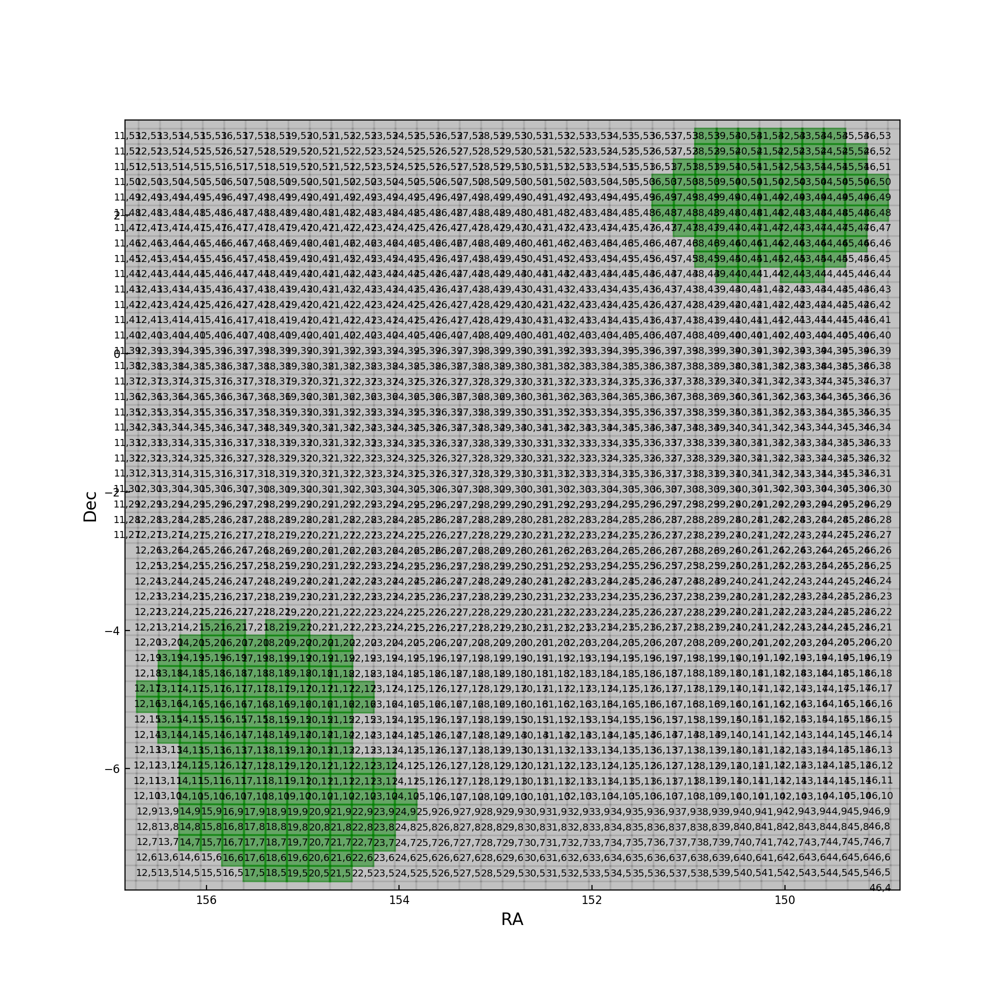

In [33]:
import lsst.geom as geom
from lsst.pipe.base import Struct
fig = plt.figure(figsize=(10,10))
axes = fig.gca()
plotTractOutline(axes, tractInfo=skymap[0], patchList=better_patch_list, fontSize=8, maxDegBeyondPatch=0.1)